# A method for classifying hydrological alteration

In [1]:
from hidrocomp.series import Flow
import math
import pandas as pd
import plotly as py
import plotly.graph_objects as go

In [2]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))

In [3]:
flow_ons.month_num_flood, flow_ons.month_abr_flood

(8, 'AS-AUG')

In [4]:
flow = flow_ana.data.combine_first(flow_sar.data).combine_first(flow_ons.data)
flow

,66160000,66231000,A19086,D19086,MANSO
1972-08-07,11.2110,NaN,NaN,NaN,NaN
1972-08-08,11.2110,NaN,NaN,NaN,NaN
1972-08-09,11.6272,NaN,NaN,NaN,NaN
1972-08-10,11.6272,NaN,NaN,NaN,NaN
1972-08-11,11.6272,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2020-07-18,NaN,NaN,41.94,121.0,NaN
2020-07-19,NaN,NaN,34.02,121.0,NaN
2020-07-20,NaN,NaN,41.93,121.0,NaN
2020-07-21,NaN,NaN,34.02,121.0,NaN


In [5]:
flow = Flow(data=flow)

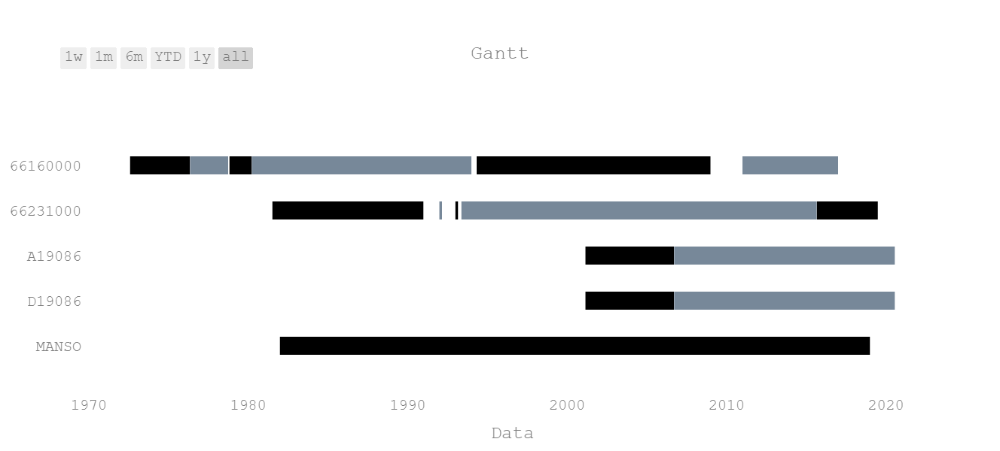

In [51]:
fig_gantt, data_gantt = flow.gantt("Gantt", size_text=20)
py.offline.iplot(fig_gantt)

In [52]:
# fig_gantt = go.Figure(fig_gantt)
# fig_gantt.write_image("gantt.png", width=1400, height=800)

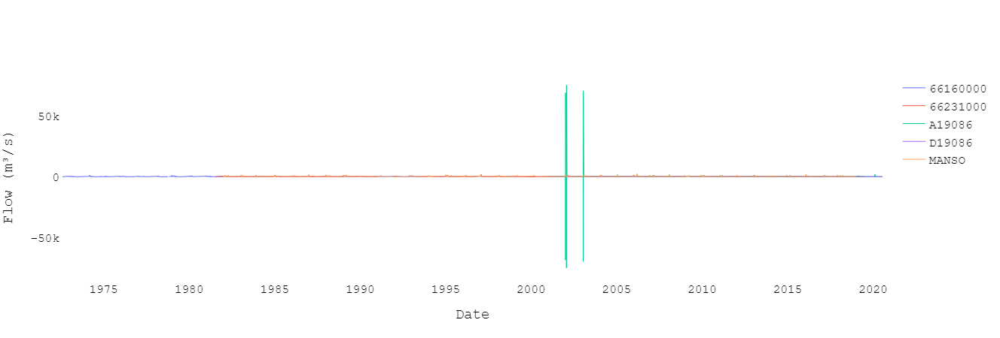

In [8]:
fig_hidro, data_hidro = flow.hydrogram("")
py.offline.iplot(fig_hidro)

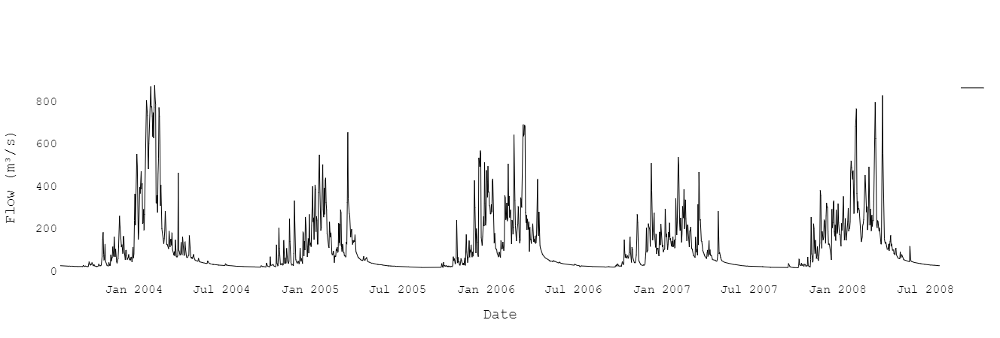

In [9]:
flow_quebo1 = Flow(data=flow_ana.data["66160000"].to_frame())
flow_quebo1.date(date_start="01/08/2003", date_end="31/07/2008")
fig_hydro_quebo1, data_hydro_quebo1 = flow_quebo1.hydrogram("")
py.offline.iplot(fig_hydro_quebo1)

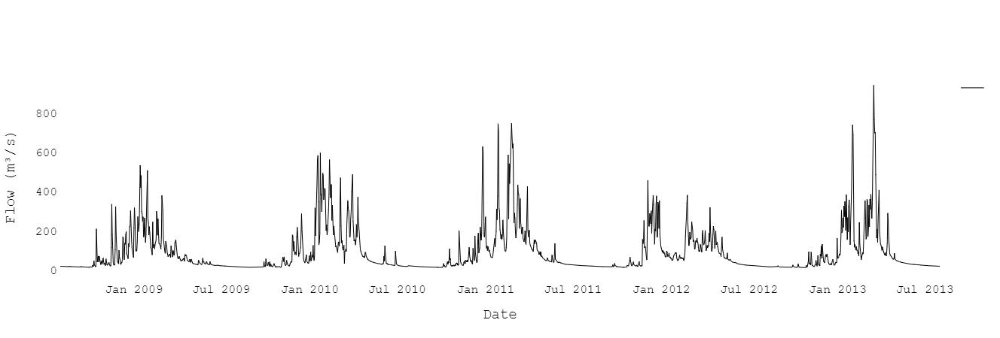

In [10]:
flow_quebo2 = Flow(data=flow_ana.data["66160000"].to_frame())
flow_quebo2.date(date_start="01/08/2011", date_end="31/07/2016")
date_range = pd.date_range(start=pd.to_datetime("01/08/2008", dayfirst=True), end=pd.to_datetime("01/08/2013", dayfirst=True))
flow_quebo2.data.index = date_range
fig_hydro_quebo2, data_hydro_quebo2 = flow_quebo2.hydrogram("")
py.offline.iplot(fig_hydro_quebo2)

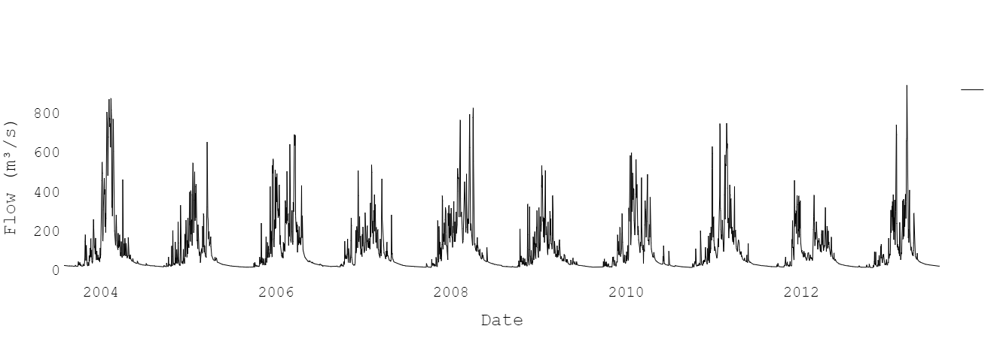

In [53]:
data_quebo = flow_quebo1.data.combine_first(flow_quebo2.data)
flow_quebo = Flow(data=data_quebo)
fig_hydro_quebo, data_hydro_quebo = flow_quebo.hydrogram("", size_text=20)
py.offline.iplot(fig_hydro_quebo)

In [12]:
flow_quebo.month_abr_flood

'AS-SEP'

In [13]:
area_sb = 4260
area_ss = 9580
f"66160000: {area_sb} km²  66231000: {area_ss} km²"

'66160000: 4260 km²  66231000: 9580 km²'

In [14]:
alpha = area_ss/area_sb
alpha

2.248826291079812

In [15]:
flow_quebo_ajuste = Flow(data=data_quebo*alpha)

## Interpolar dados

In [16]:
date_start = "01/08/2003"
date_end = "31/07/2013"

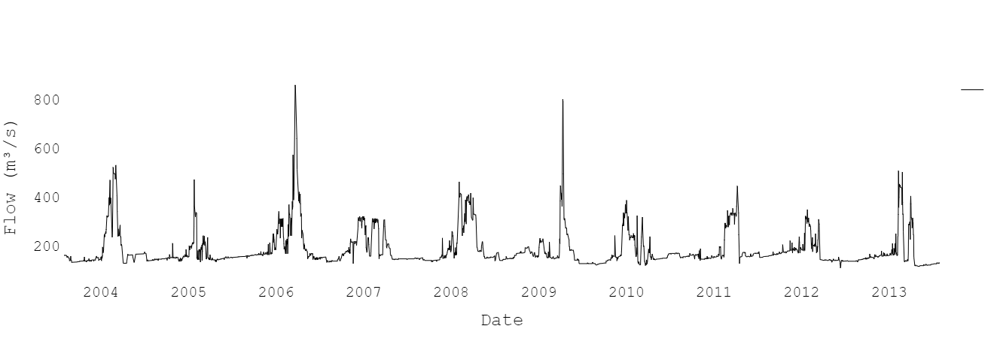

In [54]:
flow_raiz = Flow(data=flow.data["66231000"].to_frame()).date(date_start=date_start, date_end=date_end)
fig_hydro_raiz, data_hydro_raiz = flow_raiz.hydrogram("", size_text=20)
py.offline.iplot(fig_hydro_raiz)

Variables: 
- Magnitude:
    - 1-day maximum
    - 1-day minimum
- Duration:
    - High pulse duration
    - Low pulse duration
- Frequency:
    - High pulse count
    - Low pulse count
- Timing:
    - Date of maximum
    - Date of minimum

# Control x Impact

In [18]:
# data.station = "66160000"
# data.date(date_start="01/09/2001")
# data_max = data.maximum()
data_thres = flow.data["66160000"]*alpha
threshold_high = data_thres.quantile(0.75)
f"Threshold: {threshold_high}"

'Threshold: 291.61879812206575'

In [19]:
# data_min = data.minimum()
threshold_low = data_thres.quantile(0.50) # data_min.peaks.max().values[0]
f"Threshold: {threshold_low}"

'Threshold: 101.08159342723003'

## Station 66160000

## Iha

In [20]:
iha_pre = flow_quebo_ajuste.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [21]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,135.362466,684.329683
1-day minimum,12.410748,63.428115
High events count,4.131182,13.200000
Low events count,4.332051,8.900000
High events duration,2.640571,7.279913
Low events duration,22.564467,29.042088
Date of maximum,33.190572,178.408196
Date of minimum,23.319575,274.305535


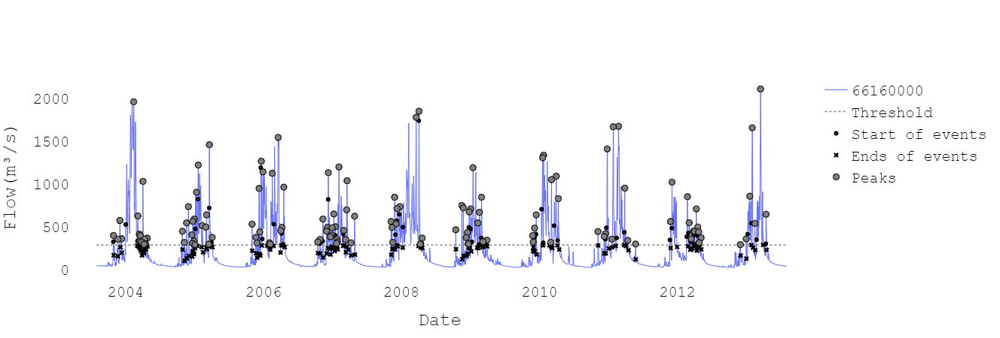

In [55]:
fig_events_high, data_events_high = iha_pre.events_high.plot_hydrogram("", size_text=20)
py.offline.iplot(fig_events_high)

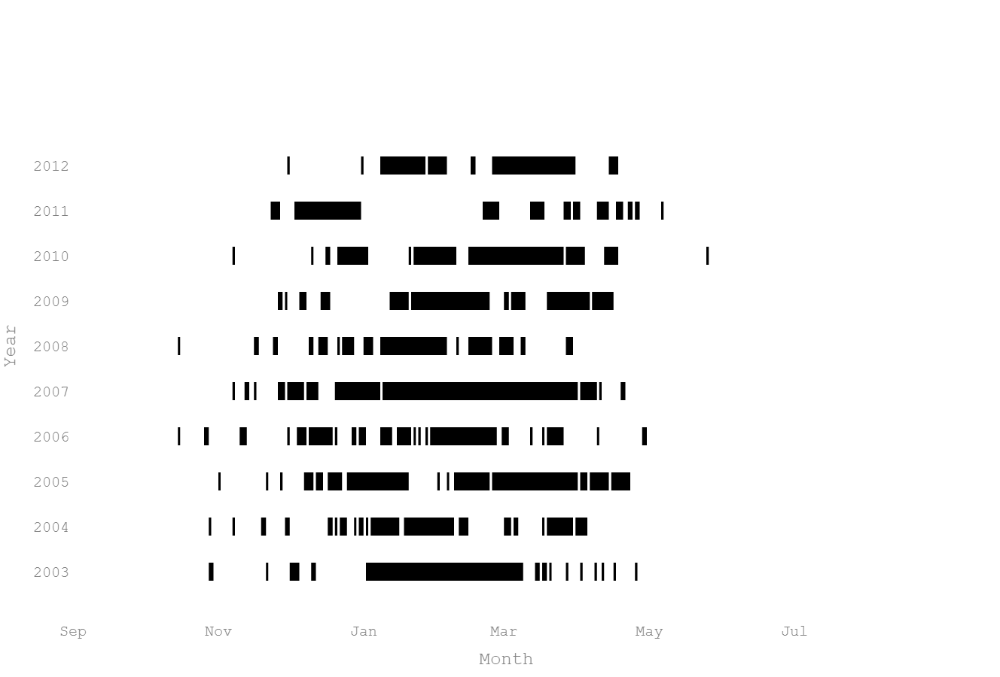

In [56]:
fig_events_spells_high, data_events_spells_high = iha_pre.events_high.plot_spells("", size_text=20)
py.offline.iplot(fig_events_spells_high)

In [57]:
# fig_spells_quebo_high = go.Figure(fig_events_spells_high)
# fig_spells_quebo_high.write_image("fig_spells_quebo_high.png", width=1400, height=1000)

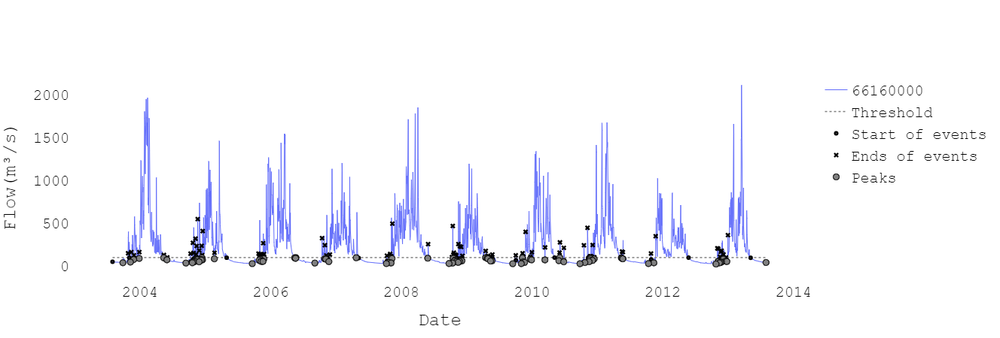

In [58]:
fig_events_low, data_events_low = iha_pre.events_low.plot_hydrogram("", size_text=20)
py.offline.iplot(fig_events_low)

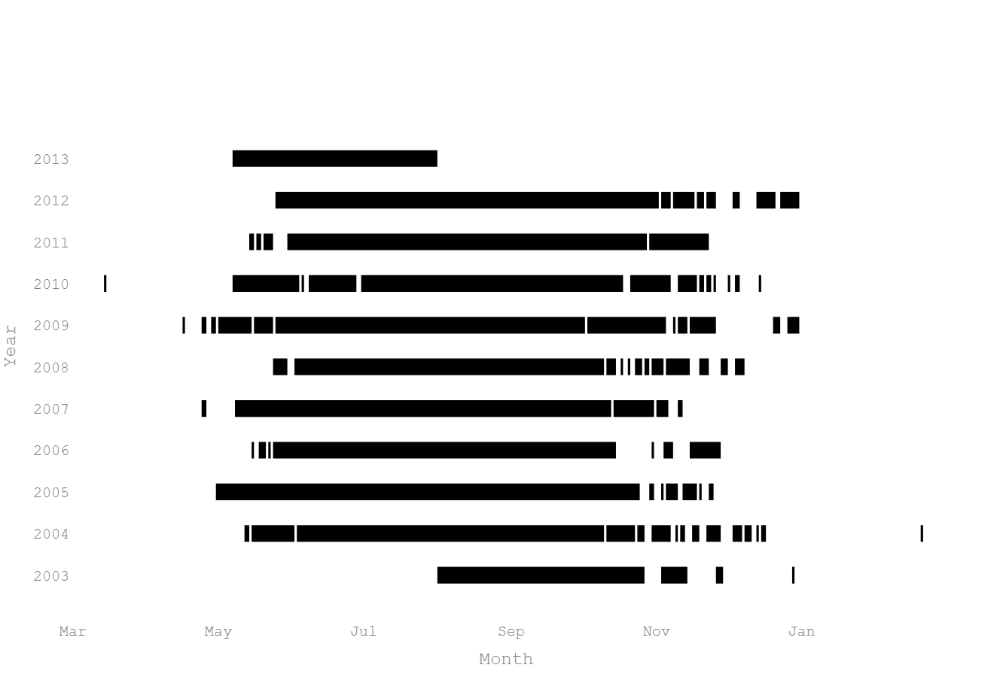

In [59]:
fig_events_spells_low, data_events_spells_low = iha_pre.events_low.plot_spells("", size_text=20)
py.offline.iplot(fig_events_spells_low)

In [60]:
# fig_spells_quebo_low = go.Figure(fig_events_spells_low)
# fig_spells_quebo_low.write_image("fig_spells_quebo_low.png", width=1400, height=1000)

## Station 66231000

In [28]:
iha_pos = flow_raiz.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1,  
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [29]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,144.456656,428.399096
1-day minimum,NaN,NaN
High events count,2.558211,3.900000
Low events count,0.000000,0.000000
High events duration,7.016470,11.797778
Low events duration,NaN,NaN
Date of maximum,35.752969,70.609206
Date of minimum,NaN,NaN


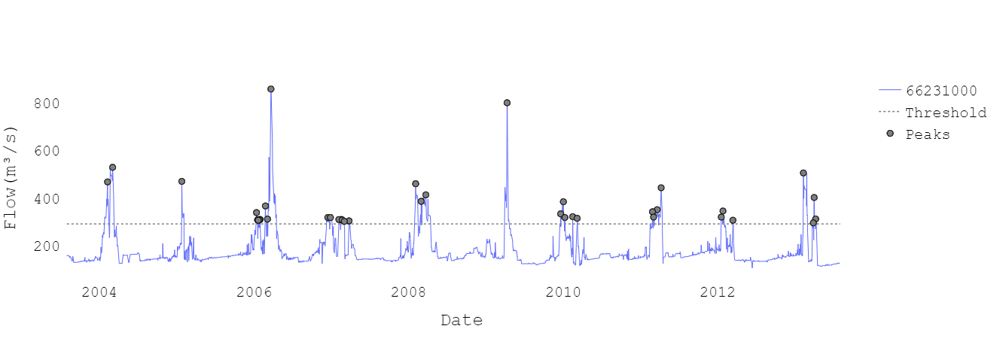

In [61]:
fig_events_high_pos, data_events_high_pos = iha_pos.events_high.plot_hydrogram("", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_high_pos)

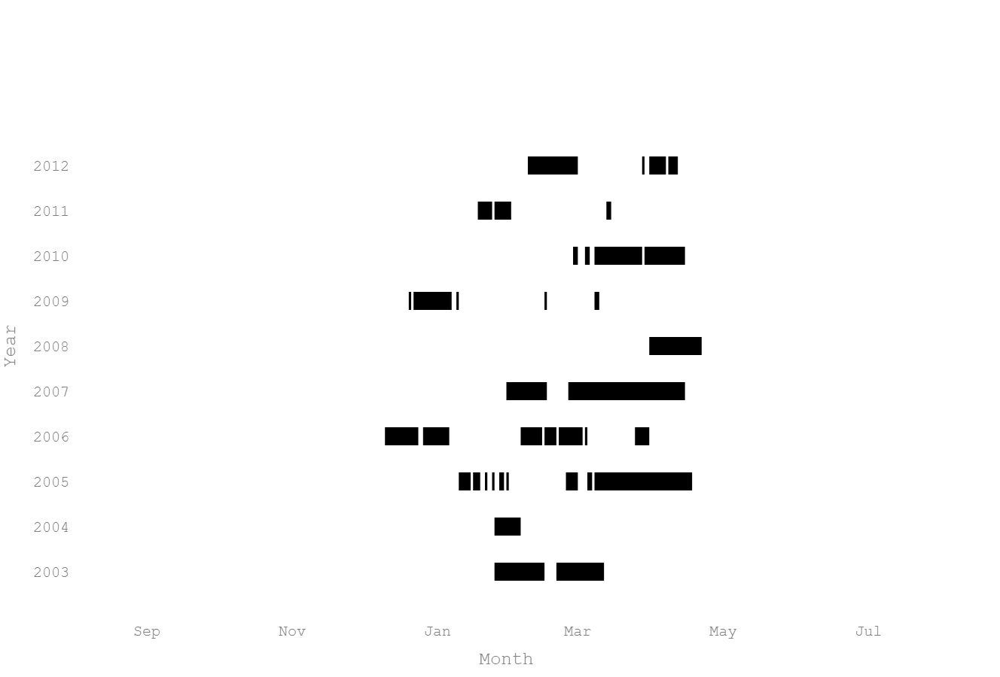

In [62]:
fig_events_spells_high_pos, data_events_spells_high_pos = iha_pos.events_high.plot_spells("", size_text=20)
py.offline.iplot(fig_events_spells_high_pos)

In [63]:
# fig_spells_raiz_high = go.Figure(fig_events_spells_high_pos)
# fig_spells_raiz_high.write_image("fig_spells_raiz_high.png", width=1400, height=1000)

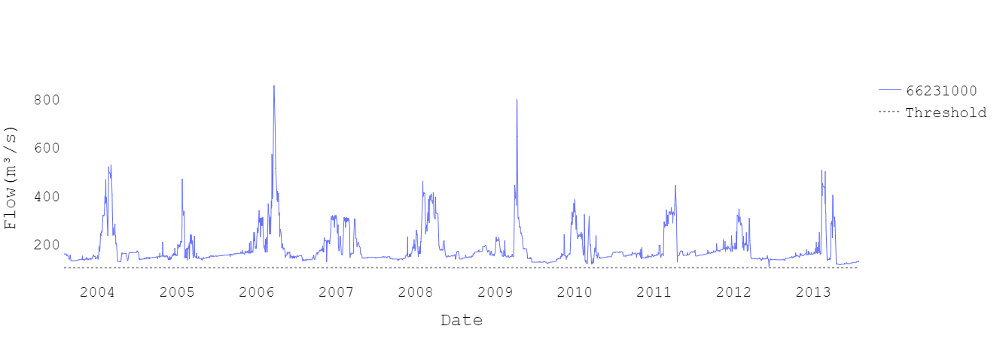

In [64]:
fig_events_low_pos, data_events_low_pos = iha_pos.events_low.plot_hydrogram("", size_text=20)
py.offline.iplot(fig_events_low_pos)

In [34]:
fig_polar_pre_high, data_polar_pre_high = iha_pre.events_high.plot_polar(title="Events High", color="#00008B")
fig_polar_pos_high, data_polar_pos_high = iha_pos.events_high.plot_polar(title="Events High", color="#00008B")

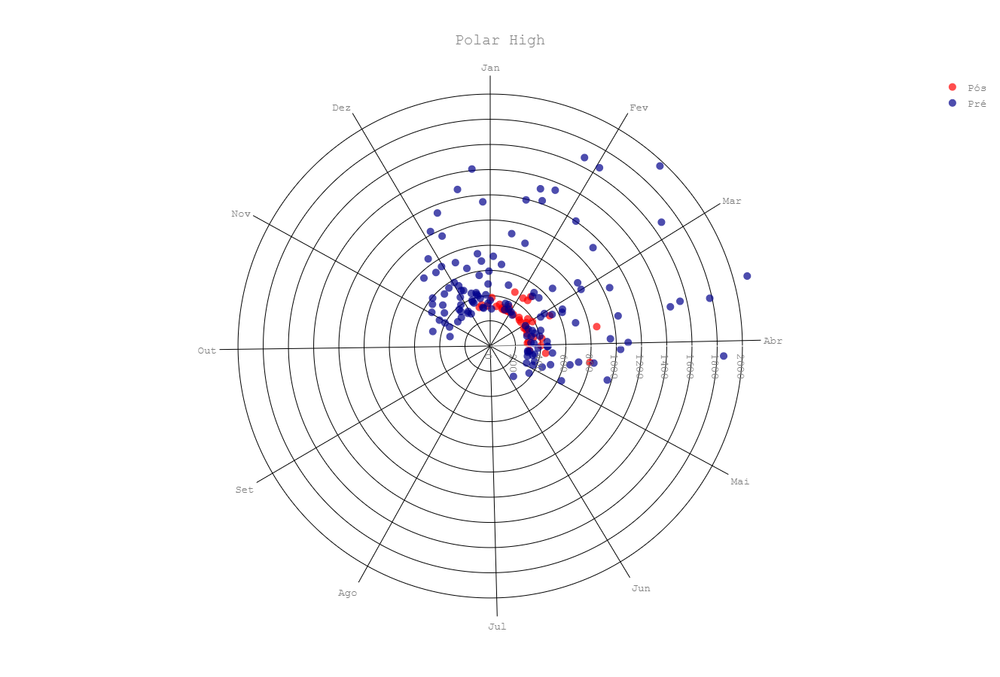

In [35]:
layout=fig_polar_pos_high['layout']

layout['title']['text'] = "Polar High"
data_polar_pos_high[0]['marker']['color'] = "red"
data_polar_pos_high[0]['name'] = "Pós"
data_polar_pre_high[0]['name'] = "Pré"
data_polar_pos_high = dict(data=data_polar_pos_high+[data_polar_pre_high[0]], layout=layout)

py.offline.iplot(data_polar_pos_high)

In [36]:
# fig_polar_two_high = go.Figure(data_polar_pos_high)
# fig_polar_two_high.write_image("fig_polar_two_high.png", width=1400, height=1000)

In [37]:
era = iha_pre.era(iha_obs=iha_pos)

In [38]:
names = {"1-day maximum": "1-day", "Date of maximum": "Date", "High events count": "Count", "High events duration": "Duration", "1-day minimum": "1-day", "Date of minimum": "Date",
         "Low events count": "Count", "Low events duration": "Duration"}

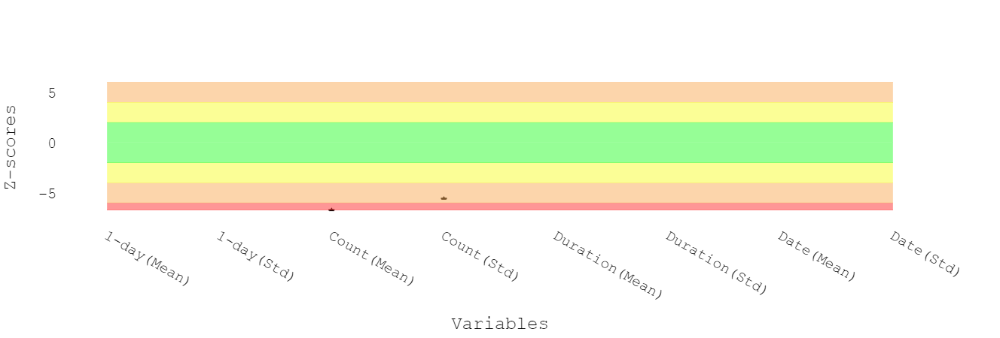

In [65]:
fig_low, data = era.plot(by_type_events="Low", showlegend=False, size_text=20, names_variables=names)
py.offline.iplot(fig_low)

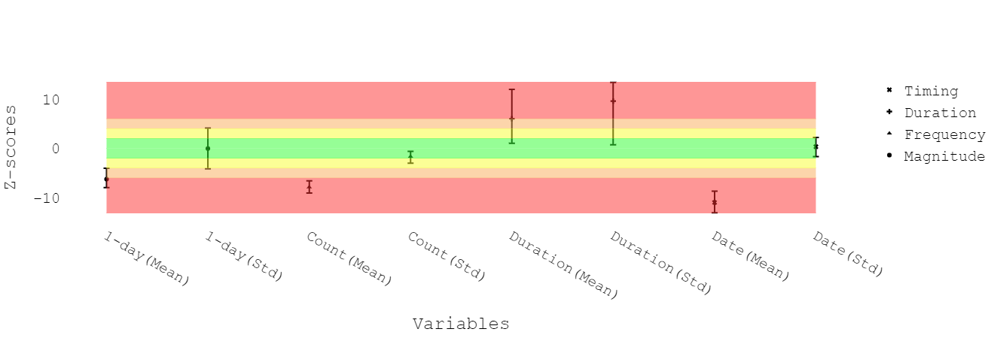

In [66]:
fig_high, data = era.plot(by_type_events="High", showlegend=True, size_text=20, names_variables=names)
py.offline.iplot(fig_high)

In [67]:
# fig_low.write_image("zscore_low_two.png", width=1200, height=800)
# fig_high.write_image("zscore_high_two.png", width=1200, height=800)

In [42]:
era.values_mean()

1-day maximum           -6.240885
1-day minimum                 NaN
Date of maximum        -10.963698
Date of minimum               NaN
High events count       -7.861777
High events duration     5.982110
Low events count        -6.717904
Low events duration           NaN
Name: Pos - mean, dtype: float64

In [43]:
era.aspects["Magnitude and Duration"].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
1-day maximum,-1.802482,1.915745,-7.954581,-4.02566,0.0,-6.240885
1-day minimum,-2.018412,1.775608,NaN,NaN,0.0,NaN


In [44]:
era.aspects["Magnitude and Duration"].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
1-day maximum,-1.917082,1.898668,-4.154437,4.095143,0.0,-0.040474
1-day minimum,-1.882797,1.603133,NaN,NaN,0.0,NaN


In [45]:
era.aspects['Frequency and Duration'].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
High events count,-1.832912,1.895619,-9.035756,-6.578315,0.0,-7.861777
Low events count,-1.973196,1.907297,-6.717904,-6.717904,0.0,-6.717904
High events duration,-1.873704,2.041711,1.031539,11.921928,0.0,5.982110
Low events duration,-1.582691,2.285390,NaN,NaN,0.0,NaN


In [46]:
era.aspects['Frequency and Duration'].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
High events count,-2.058955,1.837854,-2.995977,-0.599831,0.0,-1.657054
Low events count,-1.908322,1.886213,-5.577869,-5.577869,0.0,-5.577869
High events duration,-2.018409,1.802531,0.731645,13.361666,0.0,9.561216
Low events duration,-1.588058,1.612104,NaN,NaN,0.0,NaN


In [47]:
era.aspects['Timing Extreme'].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
Date of maximum,-1.759713,2.003282,-13.060716,-8.669828,0.0,-10.963698
Date of minimum,-1.927515,1.906628,NaN,NaN,0.0,NaN


In [48]:
era.aspects['Timing Extreme'].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
Date of maximum,-1.716422,1.879634,-1.687116,2.20724,0.0,0.327916
Date of minimum,-2.878128,1.591535,NaN,NaN,0.0,NaN


In [68]:
# flow_quebo_copy = Flow(data=flow_ana.data["66160000"].to_frame())
# flow_quebo_copy.date(date_start="01/09/2013", date_end="31/08/2016")
# flow_quebo_copy

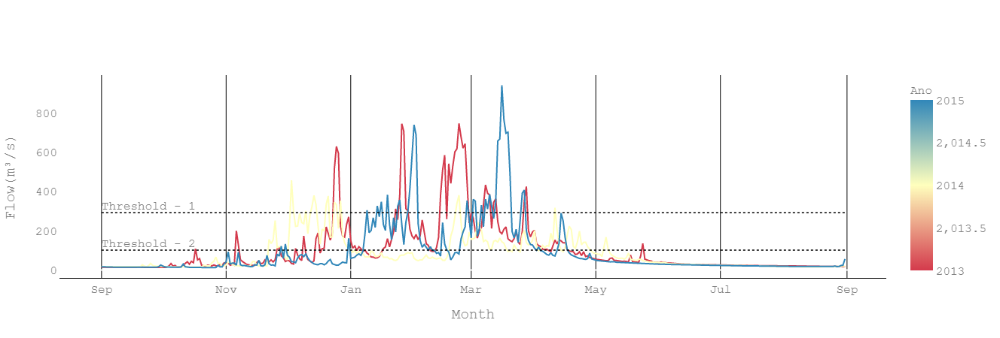

In [69]:
# fig_hydro_year, data_hydro_year = flow_quebo_copy.hydrogram_year(title="", threshold=[threshold_high, threshold_low])
# py.offline.iplot(fig_hydro_year)

In [70]:
# fig = go.Figure(fig_hydro_year)
# fig.write_image("hydro_quebo.png", width=1200, height=800)